#  Applied Machine Learning 

## Homework 5: Evaluation metrics


## Imports

In [1]:
import os
import re
import sys
from hashlib import sha1

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tests_hw5
from sklearn import datasets
from sklearn.compose import make_column_transformer
from sklearn.dummy import DummyClassifier, DummyRegressor
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LogisticRegression, Ridge
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    make_scorer,
    precision_score,
    recall_score,
)
from sklearn.model_selection import (
    GridSearchCV,
    RandomizedSearchCV,
    cross_val_score,
    cross_validate,
    train_test_split,
)
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler, LabelEncoder

<br><br>

## Exercise 1: Precision, recall, and f1 score by hand <a name="1"></a>
<hr>

Consider the problem of predicting whether a patient has a disease or not. Below are confusion matrices of two machine learning models: Model A and Model B. 

- Model A

|    Actual/Predicted      | Predicted disease | Predicted no disease |
| :------------- | -----------------------: | -----------------------: |
| **Actual disease**       | 2 | 8 |
| **Actual no disease**       | 0 | 100 |


- Model B

|    Actual/Predicted      | Predicted disease | Predicted no disease |
| :------------- | -----------------------: | -----------------------: |
| **Actual disease**       | 6 | 4 |
| **Actual no disease**       | 10 | 90 |

### 1.1 Positive vs. negative class 
rubric={points:2}

**Your tasks:**

Precision, recall, and f1 score depend upon which class is considered "positive", that is the thing you wish to find. In the example above, which class is likely to be the "positive" class? Why? 

In [38]:
# if disease  = 1 else no disease 0
# precision = TP/ TP + FP
# MOdel A
print("MODEL A: ")
print()
TP1, FP1, FN1, TN1 = 2, 0, 8, 100
precision_A = TP1 / (TP1 + FP1)
print(f"The precision value is {precision_A}")

recall_A = TP1/ (TP1 + FN1)
print(f"The recall value is {recall_A}")

f1_score_A = 2 * (precision_A * recall_A)/ (precision_A + recall_A)
print(f"The f1_score value is {f1_score_A}")



# Model B
print("MODEL B:")
print()
TP, FP, FN, TN = 6, 10, 4, 90
precision_B = TP / (TP + FP)
print(f"The precision value is {precision_B}")

recall_B = TP/ (TP + FN)
print(f"The recall value is {recall_B}")

f1_score_B = 2 * (precision_B * recall_B)/ (precision_B + recall_B)
print(f"The f1_score value is {f1_score_B}")



MODEL A: 

The precision value is 1.0
The recall value is 0.2
The f1_score value is 0.33333333333333337
MODEL B:

The precision value is 0.375
The recall value is 0.6
The f1_score value is 0.4615384615384615


<br><br>

### 1.2 Accuracy
rubric={points:2}

**Your tasks:**

Calculate accuracies for Model A and Model B. 

We'll store all metrics associated with Model A and Model B in the `results_dict` below. 

In [39]:
results_dict = {"A": {}, "B": {}}

In [40]:
results_dict["A"]["accuracy"] = (TP1 + TN1) / (TP1 + TN1 + FP1 + FN1)
results_dict["B"]["accuracy"] = (TP + TN) / (TP + TN + FP + FN)

results_dict

{'A': {'accuracy': 0.9272727272727272}, 'B': {'accuracy': 0.8727272727272727}}

In [41]:
assert tests_hw5.ex1_2_1(
    results_dict["A"]["accuracy"]
), "Your answer is incorrect, see traceback above."
print("Success")

Success


In [42]:
assert tests_hw5.ex1_2_2(
    results_dict["B"]["accuracy"]
), "Your answer is incorrect, see traceback above."
print("Success")

Success


In [43]:
pd.DataFrame(results_dict)

,A,B
accuracy,0.927273,0.872727


<br><br>

### 1.3 Which model would you pick? 
rubric={points:1}

**Your tasks:**

Which model would you pick simply based on the accuracy metric? 

In [44]:
# model A, it has a higher accuracy than model b.

<br><br>

### 1.4 Precision, recall, f1-score
rubric={points:6}

**Your tasks:**

1. Calculate precision, recall, f1-score for Model A and Model B manually, without using `scikit-learn` tools. 


In [45]:
precision_A = TP1 / ( TP1 + FP1 )
precision_B = TP / ( TP + FP )

recall_A = TP1 / ( TP1 + FN1 )
recall_B = TP / ( TP + FN )

f1_score_A = 2 * ( precision_A * recall_A ) / ( precision_A + recall_A )
f1_score_B = 2 * ( precision_B * recall_B ) / ( precision_B + recall_B )

In [46]:
results_dict["A"]["precision"] = precision_A
results_dict["B"]["precision"] = precision_B
results_dict["A"]["recall"] = recall_A
results_dict["B"]["recall"] = recall_B
results_dict["A"]["f1"] = f1_score_A
results_dict["B"]["f1"] = f1_score_B


In [47]:
assert tests_hw5.ex1_4_1(
    results_dict["A"]["precision"]
), "Your answer is incorrect, see traceback above."
print("Success")

Success


In [48]:
assert tests_hw5.ex1_4_2(
    results_dict["B"]["precision"]
), "Your answer is incorrect, see traceback above."
print("Success")

Success


In [49]:
assert tests_hw5.ex1_4_3(
    results_dict["A"]["recall"]
), "Your answer is incorrect, see traceback above."
print("Success")

Success


In [50]:
assert tests_hw5.ex1_4_4(
    results_dict["B"]["recall"]
), "Your answer is incorrect, see traceback above."
print("Success")

Success


In [51]:
assert tests_hw5.ex1_4_5(
    results_dict["A"]["f1"]
), "Your answer is incorrect, see traceback above."
print("Success")

Success


In [52]:
assert tests_hw5.ex1_4_6(
    results_dict["B"]["f1"]
), "Your answer is incorrect, see traceback above."
print("Success")

Success


Show the dataframe with all results. 

In [53]:
pd.DataFrame(results_dict)

,A,B
accuracy,0.927273,0.872727
precision,1.000000,0.375000
recall,0.200000,0.600000
f1,0.333333,0.461538


<br><br>

### 1.5 Discussion
rubric={points:4}

**Your tasks:**
1. Which metric is more informative in this problem? Why? 
2. Which model would you pick based on this information? 

In [54]:
# Recent Metrix is more informative so this metrix i would like to use.

In [55]:
# It depends upon objectives, if i want to strictly follow the rules and high accuracy than it will be Model A
#                             if i wnat the model with lineant rules at that scenareo the Model B would be perfect.


# if we want to randomly pick best model then it would be Model_B because it has highest F1 Score.

<br><br>

### (Optional) 1.6 
rubric={points:1}

**Your tasks:**

Provide 4 to 5 example classification datasets (with links) where accuracy metric would be misleading. Discuss which evaluation metric would be more appropriate for each dataset. You may consider datasets we have used in this course so far. You could also look up datasets on Kaggle. 

url_1 = "https://www.kaggle.com/datasets/utkarshx27/affordable-housing-by-town-2011-2022?select=Affordable_Housing_by_Town_2011-2022.csv"

url_2 = "https://www.kaggle.com/datasets/utkarshx27/default-of-credit-card-clients-dataset?select=default+of+credit+card+clients.xls"

url_3 = "https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud"

url_4 = "https://www.kaggle.com/code/durgancegaur/a-guide-to-any-classification-problem?scriptVersionId=87928528&cellId=5"
 

<br><br><br><br>

### Exercise 2: Classification evaluation metrics using `sklearn` <a name="2"></a>
<hr>

In general, when a dataset is imbalanced, accuracy does not provide the whole story. In class, we looked at credit card fraud dataset which is a classic example of an imbalanced dataset. 

Another example is customer churn datasets. [Customer churn](https://en.wikipedia.org/wiki/Customer_attrition) refers to the notion of customers leaving a subscription service like Netflix. In this exercise, we will try to predict customer churn in a dataset where most of the customers stay with the service and a small minority cancel their subscription. To start, please download the [Kaggle telecom customer churn dataset](https://www.kaggle.com/becksddf/churn-in-telecoms-dataset). Once you have the data, you should be able to run the following code:

The starter code below reads the data CSV as a pandas dataframe and splits it into 70% train and 30% test. 

Note that `churn` column in the dataset is the target. "True" means the customer left the subscription (churned) and "False" means they stayed.

> Note that for this kind of problem a more appropriate technique is something called survival analysis and we'll be talking about it later in the course. For now, we'll just treat it as a binary classification problem. 

In [2]:
df = pd.read_csv("bigml_59c28831336c6604c800002a.csv", encoding="utf-8")
train_df, test_df = train_test_split(df, test_size=0.3, random_state=123)
train_df

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
1402,NE,70,415,421-8535,no,no,0,213.4,86,36.28,...,77,17.40,256.6,101,11.55,5.7,4,1.54,1,False
1855,WI,67,510,417-2265,no,no,0,109.1,134,18.55,...,76,12.10,91.2,86,4.10,10.9,5,2.94,2,False
633,NJ,122,415,327-9341,no,yes,34,146.4,104,24.89,...,103,7.62,220.0,91,9.90,15.6,4,4.21,2,False
1483,NV,107,510,419-9688,yes,no,0,234.1,91,39.80,...,105,13.86,282.5,100,12.71,10.0,3,2.70,1,False
2638,HI,105,510,364-8128,no,no,0,125.4,116,21.32,...,95,22.23,241.6,104,10.87,11.4,9,3.08,2,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2154,WY,126,408,339-9798,yes,no,0,197.6,126,33.59,...,112,20.95,285.3,104,12.84,12.5,8,3.38,2,False
3089,WV,70,510,348-3777,no,yes,30,143.4,72,24.38,...,92,14.45,127.9,68,5.76,9.4,4,2.54,3,False
1766,NJ,125,415,406-6400,no,no,0,182.3,64,30.99,...,121,11.88,171.6,96,7.72,11.6,7,3.13,2,False
1122,NE,159,415,362-5111,no,no,0,189.1,105,32.15,...,147,20.92,242.0,106,10.89,10.4,5,2.81,1,True


<br><br>

### 2.1 Distribution of target values
rubric={points:4}

**Your tasks:**

Examine the distribution of target values in the train split. Do you see class imbalance? If yes, do we need to deal with it? Why or why not? 

In [3]:
train_df["churn"].value_counts(normalize=True)

False    0.850407
True     0.149593
Name: churn, dtype: float64

In [4]:
# There is class imbalanced in train split churn(target), 
# so ofcourse we need to deal with it bacause the majority class will dominate the other one,
#  as a result the model will not able to learn the minority class, it will make a decision on bases of majority class.

<br><br>

### (Optional) 2.2 EDA 
rubric={points:1}

**Your tasks:**

Come up with **two** exploratory questions you would like to answer and explore those. Briefly discuss your results in 1-3 sentences.

You are welcome to use `pandas_profiling` (see Lecture 10) but you don't have to.

In [4]:
from ydata_profiling import ProfileReport

In [5]:
ProfileReport(train_df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
train_df.info()

In [86]:
num=train_df.apply(lambda x :x.dtype=='int64' or x.dtype == 'float64')
num[num.values==True].sum()
# train_df.describe().columns

# these are numerical features

16

In [99]:
obj=train_df.apply(lambda x :x.dtype=='object')
obj.index[obj.values==True]

# these are Object Features

Index(['state', 'phone number', 'international plan', 'voice mail plan'], dtype='object')

In [91]:
train_df.describe(include='all')

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
count,2333,2333.000000,2333.000000,2333,2333,2333,2333.000000,2333.000000,2333.000000,2333.000000,...,2333.000000,2333.000000,2333.000000,2333.000000,2333.000000,2333.000000,2333.000000,2333.000000,2333.000000,2333
unique,51,NaN,NaN,2333,2,2,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,WV,NaN,NaN,421-8535,no,no,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
freq,70,NaN,NaN,1,2106,1695,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1984
mean,NaN,100.434634,436.324046,NaN,NaN,NaN,8.028290,179.655679,100.567081,30.542015,...,99.885555,17.100210,201.211745,99.988856,9.054591,10.269567,4.503215,2.773365,1.551650,NaN
std,NaN,39.642470,41.854200,NaN,NaN,NaN,13.665229,54.546284,20.202414,9.272847,...,19.788878,4.288194,50.888058,19.406455,2.290012,2.777601,2.507555,0.749929,1.328702,NaN
min,NaN,1.000000,408.000000,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000,NaN
25%,NaN,73.000000,408.000000,NaN,NaN,NaN,0.000000,143.400000,87.000000,24.380000,...,87.000000,14.220000,166.900000,87.000000,7.510000,8.500000,3.000000,2.300000,1.000000,NaN
50%,NaN,100.000000,415.000000,NaN,NaN,NaN,0.000000,179.200000,101.000000,30.460000,...,100.000000,17.200000,201.600000,100.000000,9.070000,10.400000,4.000000,2.810000,1.000000,NaN
75%,NaN,127.000000,415.000000,NaN,NaN,NaN,19.000000,216.300000,114.000000,36.770000,...,113.000000,20.060000,236.600000,113.000000,10.650000,12.100000,6.000000,3.270000,2.000000,NaN


<br><br>

### 2.3 Column transformer 
rubric={points:10}

The code below creates `X_train`, `y_train`, `X_test`, `y_test` for you. 
In preparation for building a classifier, set up a `ColumnTransformer` that performs whatever feature transformations you deem sensible. This can include dropping features if you think they are not helpful. Remember that by default `ColumnTransformer` will drop any columns that aren't accounted for when it's created.

In each case, briefly explain your rationale with 1-2 sentences. You do not need an explanation for every feature, but for every group of features that are being transformed the same way. For example, "I am doing transformation X to the following categorical features: `a`, `b`, `c` because of reason Y," etc.

In [3]:
X_train = train_df.drop(columns=["churn"])
X_test = test_df.drop(columns=["churn"])

y_train = train_df["churn"]
y_test = test_df["churn"]

###  I am saperating all features by their suitable nature.

In [4]:
numeric_features=['account length', 'number vmail messages','total day minutes', 'total day calls', 'total day charge','total eve minutes', 'total eve calls', 'total eve charge','total night minutes', 'total night calls', 'total night charge','total intl minutes', 'total intl calls', 'total intl charge']
categorical_features=['state', 'area code','customer service calls']
drop_features = ['phone number']
label_feature = ['international plan', 'voice mail plan']
feture=[['no','yes'],['no','yes']]

### I am Doing Transformation of StandardScaler on numerical_feature, OneHotEncoder and OrdinalEncoder on Categorical_features etc.

In [5]:
transformer = make_column_transformer(
    (StandardScaler(),numeric_features),
    (OrdinalEncoder(categories=feture),label_feature),
    (OneHotEncoder(handle_unknown='ignore',sparse=False,dtype=int),categorical_features),
    remainder='drop'
)


<br><br>

### 2.4 Visualizing the transformed data 
rubric={points:4}

Fit and transform your `ColumnTransformer` on your training set. Print the first 5 rows of the transformed data as a dataframe (not numpy array). See lecture 10 for code that can get you the new column names after transforming. 

In [6]:
X_train_transformed =transformer.fit_transform(X_train)

In [7]:
ohe_categorical = list(transformer.named_transformers_.onehotencoder.get_feature_names(categorical_features))
features = numeric_features + label_feature + ohe_categorical
X_train_transformed = pd.DataFrame(X_train_transformed,columns=features)

C:\Users\HP\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [8]:
X_train_transformed.head()

,account length,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,...,customer service calls_0,customer service calls_1,customer service calls_2,customer service calls_3,customer service calls_4,customer service calls_5,customer service calls_6,customer service calls_7,customer service calls_8,customer service calls_9
0,-0.767893,-0.587624,0.618769,-0.721211,0.618927,0.069871,-1.156734,0.069926,1.088667,0.052115,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.843585,-0.587624,-1.293778,1.655252,-1.293517,-1.167277,-1.207278,-1.166291,-2.162302,-0.720990,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.544113,1.900976,-0.609809,0.169963,-0.609654,-2.210130,0.157417,-2.211244,0.369287,-0.463288,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.165650,-0.587624,0.998345,-0.473663,0.998611,-0.754894,0.258506,-0.755774,1.597736,0.000574,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.115188,-0.587624,-0.994886,0.764078,-0.994731,1.195994,-0.246937,1.196515,0.793839,0.206736,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<br><br>

### 2.5 area code feature
rubric={points:4}

The original dataset had a feature called `area code`. Let's assume we encoded this feature with one-hot encoding.

1. The area codes were numbers to begin with. Why do we want to use one-hot encoding on this feature?
2. What were the possible values of `area code`? 
3. What new feature(s) were created to replace `area code`? 

In [9]:
# 1. The area codes were numbers to begin with. Why do we want to use one-hot encoding on this feature?
# ans :- The  area codes were numbers to begin with, but it used to indicate location and it doesn't have any weightage
#        so it is categorical feature Thats why we are using one hot encoder.

In [10]:
# 2. What were the possible values of area code?
# ans :- Here are only 3 possible values as we can see below.
train_df["area code"].value_counts().index

Int64Index([415, 408, 510], dtype='int64')

In [11]:
# 3. What new feature(s) were created to replace area code?
X_train_transformed[["area code_408","area code_415","area code_510"]].sample(3)

,area code_408,area code_415,area code_510
2229,0.0,1.0,0.0
736,1.0,0.0,0.0
1398,0.0,1.0,0.0


### 2.6 Dummy classifier
rubric={points:4}

**Your tasks:**

Create a `DummyClassifier`. Report the following scoring metrics via cross-validation: accuracy, precision, recall, f1-score. Briefly comment on your results, including any warnings the code produces (2 sentences max).

In [12]:
from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix,
    f1_score,
    make_scorer,
    precision_score,
    recall_score,
)

In [13]:
pipe = make_pipeline(transformer,DummyClassifier())
scoring = ["accuracy", "f1", "recall", "precision"]
dummy_result = pd.DataFrame(cross_validate(pipe,X_train,y_train,return_train_score=True,scoring=scoring))
dummy_result = pd.DataFrame(np.mean(dummy_result))
dummy_result.T

C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\HP\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1318: UndefinedMetricWarning: Precision is ill-defin

,fit_time,score_time,test_accuracy,train_accuracy,test_f1,train_f1,test_recall,train_recall,test_precision,train_precision
0,0.008783,0.007325,0.850408,0.850407,0.0,0.0,0.0,0.0,0.0,0.0


In [14]:
# Our Model's highest accuracy 85% and most repeated y value is 0.

<br><br>

### 2.7 Logistic regression
rubric={points:8} 

**Your tasks:**

1. Train and score a logistic regression classifier on the dataset. 
2. Report the same metrics as in the previous part.
3. Are you satisfied with the results? Use your `DummyClassifier` results as a reference point. Discuss in a few sentences. 

In [15]:
# 1. Train and score a logistic regression classifier on the dataset.
pipe1 = make_pipeline(transformer,LogisticRegression())
pipe1.fit(X_train,y_train)
pipe1.score(X_test,y_test)

0.876

In [16]:
# 2. Report the same metrics as in the previous part.
logistic_result = pd.DataFrame(cross_validate(pipe1,X_train,y_train,return_train_score=True,scoring=scoring))
logistic_result = pd.DataFrame(np.mean(logistic_result))
logistic_result.T

C:\Users\HP\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3430: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


,fit_time,score_time,test_accuracy,train_accuracy,test_f1,train_f1,test_recall,train_recall,test_precision,train_precision
0,0.057845,0.007894,0.850405,0.859624,0.305433,0.35434,0.220704,0.257885,0.506861,0.567076


In [17]:
# 3. Are you satisfied with the results? Use your DummyClassifier results as a reference point. Discuss in a few sentences.
# ans :- yes logically current accuracy score is better than the Dummyclassifier.
#        because Dummyclassifier gives the baseline(most Frequent value) and in order to create better model,
#        it should be perform better than baseline and in this scenario model accuracy is higher than the Dummyclassifier.

### 2.8 Logistic regression with `class_weight`
rubric={points:6}

**Your tasks:**

1. Set the `class_weight` parameter of your logistic regression model to `'balanced'` and report the same metrics as in the previous part. 
2. Do you prefer this model to the one in the previous part? Discuss your results in a few sentences.

In [18]:
pipe2 = make_pipeline(transformer,LogisticRegression(class_weight="balanced"))
pipe2.fit(X_train,y_train)
pipe2.score(X_test,y_test)

C:\Users\HP\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.842

In [19]:
weight_result = pd.DataFrame(cross_validate(pipe2,X_train,y_train,return_train_score=True,scoring=scoring))
weight_result = pd.DataFrame(np.mean(weight_result))
weight_result.T

C:\Users\HP\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
C:\Users\HP\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

,fit_time,score_time,test_accuracy,train_accuracy,test_f1,train_f1,test_recall,train_recall,test_precision,train_precision
0,0.05328,0.007581,0.814385,0.832296,0.553638,0.600734,0.765135,0.843121,0.434803,0.466627


<br><br>

### 2.9 Hyperparameter optimization
rubric={points:10}

Now let's tune the hyperparameters of our `LogisticRegression` using `GridSearchCV` to maximize cross-validation f1 score. 

**Your tasks:**

1. Jointly optimize `C` (choose some reasonable values) and `class_weight` (`None` vs. `'balanced'`) with `GridSearchCV` and `scoring="f1"`. 
2. What values of `C` and `class_weight` are chosen and what is the best cross-validation f1 score?

In [20]:
pipe3 = make_pipeline(transformer,LogisticRegression())
param_grids  =  {
    "logisticregression__C" : [0.001, 0.01, 0.1, 1, 10, 100],
    "logisticregression__class_weight" : [None,"balanced"]
}

grid_search = GridSearchCV(pipe3,param_grid=param_grids,scoring="f1",cv=5,n_jobs=-1,return_train_score=True)
grid_search.fit(X_train,y_train)
best_pm = grid_search.best_params_

C:\Users\HP\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [21]:
print("Values of Best Parameters :",best_pm)
print("Best f1 score of grid search : ",grid_search.best_score_)

Values of Best Parameters : {'logisticregression__C': 1, 'logisticregression__class_weight': 'balanced'}
Best f1 score of grid search :  0.5536376005909356


In [22]:
# pd.DataFrame(grid_search.cv_results_).sort_values("rank_test_score").T

<br><br>

### 2.10 Test results
rubric={points:10}

**Your tasks**
1. Evaluate the best model on the test set. In particular show each of the following on the test set:  
    - Confusion matrix. 
    - Classification report. 
    - Precision-recall curve with average precision score.     
    - ROC curve with AUC. 
3. Comment on the results.    

> Note that we are not doing it here but in real life, you would also plot confusion matrix, precision-recall curve, and ROC curve on validation data to examine errors and to choose a threshold which works for your operating point. 

In [34]:
pipe4 = make_pipeline(transformer,LogisticRegression(C=1,class_weight="balanced"))
pipe4.fit(X_train,y_train)

C:\Users\HP\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  ['account length',
                                                   'number vmail messages',
                                                   'total day minutes',
                                                   'total day calls',
                                                   'total day charge',
                                                   'total eve minutes',
                                                   'total eve calls',
                                                   'total eve charge',
                                                   'total night minutes',
                                                   'total night calls',
                                                   'total night charge',
                                    

In [35]:
y_pred = pipe4.predict(X_train)

In [36]:
# Confusion Matrix
TN,FP,FN,TP = confusion_matrix(y_train,y_pred).ravel()

In [74]:
# Classification report
print(classification_report(y_train,y_pred,target_names=["non-fraud", "fraud"]))

              precision    recall  f1-score   support

   non-fraud       0.97      0.83      0.90      1984
       fraud       0.47      0.85      0.61       349

    accuracy                           0.84      2333
   macro avg       0.72      0.84      0.75      2333
weighted avg       0.90      0.84      0.85      2333



# Precision recall curve and  AP Score

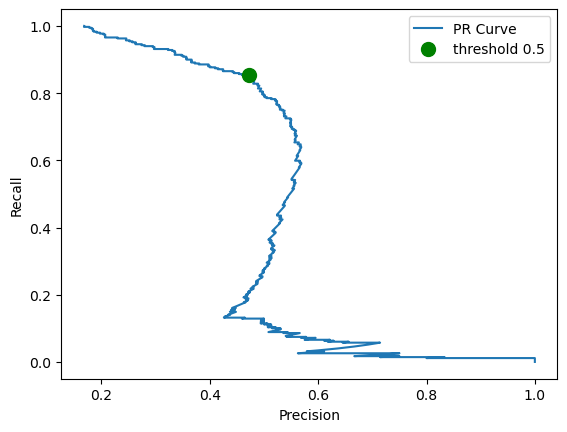

In [75]:
from sklearn.metrics import precision_recall_curve

precision, recall, thresholds = precision_recall_curve(y_train,pipe4.predict_proba(X_train)[:,1])
plt.plot(precision,recall, label = "PR Curve")
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.plot(
    precision_score(y_train, pipe4.predict_proba(X_train)[:,1]>0.5),
    recall_score(y_train, pipe4.predict_proba(X_train)[:,1]>0.5),
    "og",
    markersize=10,
    label="threshold 0.5",
)
plt.legend(loc="best");

In [76]:
# AP Score
from sklearn.metrics import average_precision_score

ap_lr = average_precision_score(y_train, pipe4.predict_proba(X_train)[:, 1])
print("Average precision of logistic regression: {:.3f}".format(ap_lr))

Average precision of logistic regression: 0.505


# ROC curve with AUC.

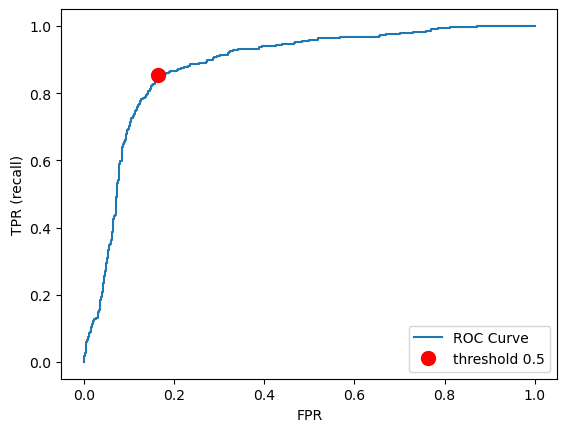

In [79]:
from sklearn.metrics import roc_curve

fpr, tpr, thresholds = roc_curve(y_train, pipe4.predict_proba(X_train)[:, 1])
plt.plot(fpr, tpr, label="ROC Curve")
plt.xlabel("FPR")
plt.ylabel("TPR (recall)")
# print(thresholds)
default_threshold = np.argmin(np.abs(thresholds - 0.5))
# print(default_threshold)
plt.plot(
    fpr[default_threshold],
    tpr[default_threshold],
    "or",
    markersize=10,
    label="threshold 0.5",
)
plt.legend(loc="best");

In [91]:
from sklearn.metrics import roc_auc_score

roc_lr = roc_auc_score(y_train, pipe4.predict_proba(X_train)[:, 1])
print("AUC for logistic regression: {:.3f}".format(roc_lr))

AUC for logistic regression: 0.881


<br><br><br><br>

### Exercise 3: Regression metrics <a name="3"></a>
<hr> 


For this exercise, we'll use [California housing dataset](https://scikit-learn.org/stable/modules/generated/sklearn.datasets.fetch_california_housing.html) from `sklearn datasets`. The code below loads the dataset.  

In [2]:
from sklearn.datasets import fetch_california_housing

housing_df = fetch_california_housing(as_frame=True).frame

### 3.1: Data spitting and exploration 
rubric={points:4}

**Your tasks:**

1. Split the data into train (80%) and test (20%) splits. 
2. Explore the train split. Do you need to apply any transformations on the data? If yes, create a preprocessor with the appropriate transformations. 
3. Separate `X` and `y` in train and test splits. 

In [3]:
train_df , test_df = train_test_split(housing_df,test_size=0.2,random_state=123)

In [5]:
x_train = train_df.drop('MedHouseVal',axis=1)
y_train = train_df["MedHouseVal"]
x_test = test_df.drop("MedHouseVal",axis=1)
y_test = test_df["MedHouseVal"]

In [6]:
drop = set(["Latitude","Longitude"])
numeric =list(set(train_df.columns) - drop)
numeric

['MedInc',
 'Population',
 'AveBedrms',
 'HouseAge',
 'AveRooms',
 'AveOccup',
 'MedHouseVal']

In [7]:
num_fet = ['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup']

In [8]:
transformer = make_column_transformer(
    (StandardScaler(),num_fet),
    remainder="drop"
)

<br><br>

### 3.2 Baseline: DummyRegressor 
rubric={points:2}

**Your tasks:**
1. Carry out cross-validation using `DummyRegressor` with default scoring. 
2. What metric is used for scoring by default? 

In [9]:
pipe=make_pipeline(transformer,DummyRegressor())
pipe.fit(x_train,y_train)
ans=pd.DataFrame(cross_validate(pipe,x_train,y_train,return_train_score=True))
np.mean(ans)

C:\Users\HP\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3430: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


fit_time       0.006640
score_time     0.003047
test_score    -0.000147
train_score    0.000000
dtype: float64

In [16]:
# By default scoring will be None or R2 . 

<br><br>

### 3.3 Different regressors
rubric={points:8}

In this exercise, we are going to use [`RandomForestRegressor`](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestRegressor.html) model which we haven't looked into yet. At this point you should feel comfortable using models with our usual ML workflow even if you don't know the details. We'll talk about `RandomForestRegressor` later in the course.  

The code below defines a custom scorer called `mape_scorer` and creates dictionaries for different regressors (`models`) and different scoring metrics (`score_types_reg`). 

**Your tasks:**

1. Using the `models` and the evaluation metrics `score_types_reg` in the code below, carry out cross-validation with each model, by passing the evaluation metrics to `scoring` argument of `cross_validate`. Use a pipeline with the model as an estimator if you are applying any transformations. 
2. Show results as a dataframe. 
3. Interpret the results. How do the models compare to the baseline? Which model seems to be performing well with different metrics? 


In [10]:
def mape(true, pred):
    return 100.0 * np.mean(np.abs((pred - true) / true))


# make a scorer function that we can pass into cross-validation
mape_scorer = make_scorer(mape, greater_is_better=False)

models = {
    "Ridge": Ridge(),
    "Random Forest": RandomForestRegressor(),
}

score_types_reg = {
    "neg_mean_squared_error": "neg_mean_squared_error",
    "neg_root_mean_squared_error": "neg_root_mean_squared_error",
    "neg_mean_absolute_error": "neg_mean_absolute_error",
    "r2": "r2",
    "mape_scorer": mape_scorer,
}

scoring = ['neg_mean_squared_error', 'neg_root_mean_squared_error', 'neg_mean_absolute_error', 'r2']


In [11]:
pipe = make_pipeline(transformer,RandomForestRegressor())
result = cross_validate(pipe,x_train,y_train,return_train_score=True,scoring=score_types_reg)

In [12]:
res = pd.DataFrame(result).mean()
ans = pd.DataFrame(res,columns=["RandomForestRegressor"])
ans

,RandomForestRegressor
fit_time,6.247081
score_time,0.106338
test_neg_mean_squared_error,-0.420784
train_neg_mean_squared_error,-0.058882
test_neg_root_mean_squared_error,-0.648587
train_neg_root_mean_squared_error,-0.242652
test_neg_mean_absolute_error,-0.464492
train_neg_mean_absolute_error,-0.172343
test_r2,0.683769
train_r2,0.955791


<br><br>

### (Optional) 3.4 Hyperparameter optimization 
rubric={points:1}

**Your tasks:**
1. Carry out hyperparameter optimization using `RandomizedSearchCV` and `Ridge` with the following `param_dist`. The `alpha` hyperparameter of `Ridge` controls the fundamental tradeoff. Choose the metric of your choice for hyperparameter optimization. 
2. Are you getting better scores compared to the default values?

In [13]:
from scipy.stats import loguniform

param_dist = {"ridge__alpha": loguniform(1e-3, 1e3)}
pipe1 = make_pipeline(transformer,Ridge())

In [14]:
random_cv = RandomizedSearchCV(pipe1,param_distributions=param_dist,cv=5,n_iter=500,n_jobs=-1,random_state=123)
random_cv.fit(x_train,y_train)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('columntransformer',
                                              ColumnTransformer(transformers=[('standardscaler',
                                                                               StandardScaler(),
                                                                               ['MedInc',
                                                                                'HouseAge',
                                                                                'AveRooms',
                                                                                'AveBedrms',
                                                                                'Population',
                                                                                'AveOccup'])])),
                                             ('ridge', Ridge())]),
                   n_iter=500, n_jobs=-1,
                   param_distributions={'ridge_

In [15]:
best_alpha = random_cv.best_params_['ridge__alpha']
best_alpha

0.0010011319593741428

In [123]:
# pd.DataFrame(random_cv.cv_results_).set_index("rank_test_score").sort_index().T

In [34]:
alpha_pipe = make_pipeline(transformer,Ridge(alpha=best_alpha))
alpha_pipe.fit(x_train,y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('standardscaler',
                                                  StandardScaler(),
                                                  ['MedInc', 'HouseAge',
                                                   'AveRooms', 'AveBedrms',
                                                   'Population',
                                                   'AveOccup'])])),
                ('ridge', Ridge(alpha=0.0010011319593741428))])

In [32]:
alpha_pipe.score(x_train,y_train)

0.5404135596156019

<br><br>

### 3.5 Test results
rubric={points:4}

**Your tasks:**

1. Try the best model on the test set.
2. Briefly comment on the results. (1 to 2 sentences) 

In [33]:
alpha_pipe.score(x_test,y_test)

0.5365053345276982

In [ ]:
# The Score of test set is almost around same from train set, but overall score is very low so this kind
#  of model is not suitable.

<br><br>

### 3.6 Model interpretation  
rubric={points:4}

Ridge is a linear model and it learns coefficients associated with each feature during `fit()`. 

**Your tasks:**

1. Visualize coefficients learned by the `Ridge` model above as a pandas dataframe with two columns: features and coefficients. If you attempted 3.4, use the `Ridge` model with best hyperparameters. Otherwise use the `Ridge` model with default hyperparameters. 
2. Increasing which feature values would result in higher housing price? 

In [93]:
features = list(alpha_pipe.named_steps.columntransformer.feature_names_in_[:-2])
visual = pd.DataFrame(alpha_pipe.named_steps.ridge.coef_,columns=["Coefs"],index=features).reset_index()
visual

,index,Coefs
0,MedInc,1.027937
1,HouseAge,0.204272
2,AveRooms,-0.549098
3,AveBedrms,0.495496
4,Population,0.022814
5,AveOccup,-0.049215


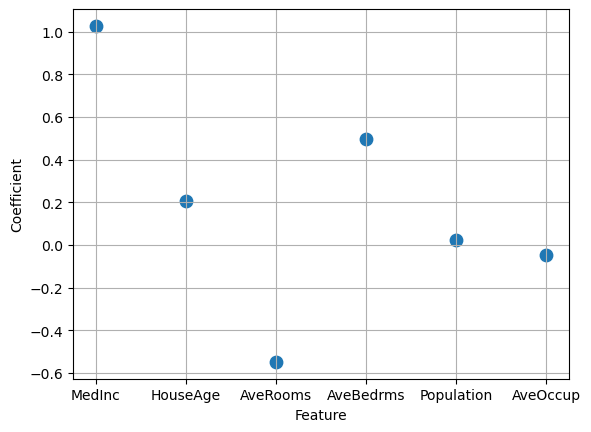

In [102]:
plt.scatter(visual["index"],visual["Coefs"],s=80)
plt.grid(visible=True)
plt.xlabel("Feature")
plt.ylabel("Coefficient")
plt.show()

In [ ]:
# 2. Increasing which feature values would result in higher housing price? 
# --> After figuring this insights as we can see "Medinc" is the feature that highly-correlated with Price of House,
#     then after "AveBedrooms" feature is also second highly correlated with movement of price so these two features 
#     are highly contributing in price prediction of House.

<br><br>